In [1]:
# Import required libraraies
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection  import train_test_split, GridSearchCV

import warnings
warnings.filterwarnings('ignore')

In [2]:
 #reading avocado.csv file
data = pd.read_csv('avocado.csv')
#Looking into top 5 rows
data.head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


In [3]:
#Looking for  max rows
pd.set_option('display.max.rows',None)

In [4]:
# Check Column name:
data.columns

Index(['Unnamed: 0', 'Date', 'AveragePrice', 'Total Volume', '4046', '4225',
       '4770', 'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags', 'type',
       'year', 'region'],
      dtype='object')

In [5]:
# Checking  total number columns and rows
data.shape

(18249, 14)

In [6]:
#we see that dataset as 18249 rows and 14 columns

In [7]:
#removing duplicate values
data.drop_duplicates(inplace=True)

In [8]:
# Checking after removing duplicates
data.shape

(18249, 14)

In [9]:
# There is no duplicate value in our dataset

In [10]:
#Checking the datatype of each variables
data.dtypes

Unnamed: 0        int64
Date             object
AveragePrice    float64
Total Volume    float64
4046            float64
4225            float64
4770            float64
Total Bags      float64
Small Bags      float64
Large Bags      float64
XLarge Bags     float64
type             object
year              int64
region           object
dtype: object

###### Identifing the type of Problem- Output: Average Price.

#As per problem statement label variable i.e. AveragePrice is float64 i.e. continuous value so we'll use Regression to learn our model.

In [11]:
# Checking Null values of each attributes
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18249 entries, 0 to 18248
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    18249 non-null  int64  
 1   Date          18249 non-null  object 
 2   AveragePrice  18249 non-null  float64
 3   Total Volume  18249 non-null  float64
 4   4046          18249 non-null  float64
 5   4225          18249 non-null  float64
 6   4770          18249 non-null  float64
 7   Total Bags    18249 non-null  float64
 8   Small Bags    18249 non-null  float64
 9   Large Bags    18249 non-null  float64
 10  XLarge Bags   18249 non-null  float64
 11  type          18249 non-null  object 
 12  year          18249 non-null  int64  
 13  region        18249 non-null  object 
dtypes: float64(9), int64(2), object(3)
memory usage: 2.1+ MB


In [12]:
# we see that there is no null value in dataset.

In [13]:
data.isnull().sum()

Unnamed: 0      0
Date            0
AveragePrice    0
Total Volume    0
4046            0
4225            0
4770            0
Total Bags      0
Small Bags      0
Large Bags      0
XLarge Bags     0
type            0
year            0
region          0
dtype: int64

In [14]:
# Checking missing values of each attributes
data.isna().sum()

Unnamed: 0      0
Date            0
AveragePrice    0
Total Volume    0
4046            0
4225            0
4770            0
Total Bags      0
Small Bags      0
Large Bags      0
XLarge Bags     0
type            0
year            0
region          0
dtype: int64

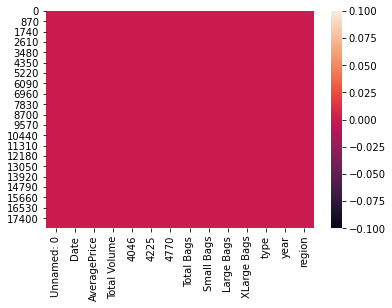

In [15]:
#Looking for null values if any, in heatmap
sns.heatmap(data.isna())
plt.show()

In [16]:
#we see throw visualization there is no missing value in any variable

In [17]:
#Checking Statistics summary of dataset
data.describe()

,Unnamed: 0,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year
count,18249.000000,18249.000000,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,18249.000000,18249.000000
mean,24.232232,1.405978,8.506440e+05,2.930084e+05,2.951546e+05,2.283974e+04,2.396392e+05,1.821947e+05,5.433809e+04,3106.426507,2016.147899
std,15.481045,0.402677,3.453545e+06,1.264989e+06,1.204120e+06,1.074641e+05,9.862424e+05,7.461785e+05,2.439660e+05,17692.894652,0.939938
min,0.000000,0.440000,8.456000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,2015.000000
25%,10.000000,1.100000,1.083858e+04,8.540700e+02,3.008780e+03,0.000000e+00,5.088640e+03,2.849420e+03,1.274700e+02,0.000000,2015.000000
50%,24.000000,1.370000,1.073768e+05,8.645300e+03,2.906102e+04,1.849900e+02,3.974383e+04,2.636282e+04,2.647710e+03,0.000000,2016.000000
75%,38.000000,1.660000,4.329623e+05,1.110202e+05,1.502069e+05,6.243420e+03,1.107834e+05,8.333767e+04,2.202925e+04,132.500000,2017.000000
max,52.000000,3.250000,6.250565e+07,2.274362e+07,2.047057e+07,2.546439e+06,1.937313e+07,1.338459e+07,5.719097e+06,551693.650000,2018.000000


In [18]:
#Few columns have very low values in it, where few have very high values. Hence Scaling will be required to train our model

In [19]:
#Adding Date,Month and Year Column to get the better insight
data['date']=pd.DatetimeIndex(data['Date']).day
data['Month']=pd.DatetimeIndex(data['Date']).month

In [20]:
data.drop(['Unnamed: 0','Date'], axis=1, inplace=True)

In [21]:
data.head()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,date,Month
0,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,27,12
1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,20,12
2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,13,12
3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,6,12
4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,29,11


In [22]:
# Checking correlation in dataset
cor = data.corr()
cor

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,date,Month
AveragePrice,1.000000,-0.192752,-0.208317,-0.172928,-0.179446,-0.177088,-0.174730,-0.172940,-0.117592,0.093197,0.027386,0.162409
Total Volume,-0.192752,1.000000,0.977863,0.974181,0.872202,0.963047,0.967238,0.880640,0.747157,0.017193,-0.009747,-0.024689
4046,-0.208317,0.977863,1.000000,0.926110,0.833389,0.920057,0.925280,0.838645,0.699377,0.003353,-0.010159,-0.025803
4225,-0.172928,0.974181,0.926110,1.000000,0.887855,0.905787,0.916031,0.810015,0.688809,-0.009559,-0.012393,-0.022108
4770,-0.179446,0.872202,0.833389,0.887855,1.000000,0.792314,0.802733,0.698471,0.679861,-0.036531,-0.009009,-0.033424
Total Bags,-0.177088,0.963047,0.920057,0.905787,0.792314,1.000000,0.994335,0.943009,0.804233,0.071552,-0.004988,-0.022724
Small Bags,-0.174730,0.967238,0.925280,0.916031,0.802733,0.994335,1.000000,0.902589,0.806845,0.063915,-0.003870,-0.023126
Large Bags,-0.172940,0.880640,0.838645,0.810015,0.698471,0.943009,0.902589,1.000000,0.710858,0.087891,-0.008352,-0.020187
XLarge Bags,-0.117592,0.747157,0.699377,0.688809,0.679861,0.804233,0.806845,0.710858,1.000000,0.081033,0.000319,-0.012969
year,0.093197,0.017193,0.003353,-0.009559,-0.036531,0.071552,0.063915,0.087891,0.081033,1.000000,0.004475,-0.177050


In [23]:
# we can understanding properly as we use heatmap to find correleation

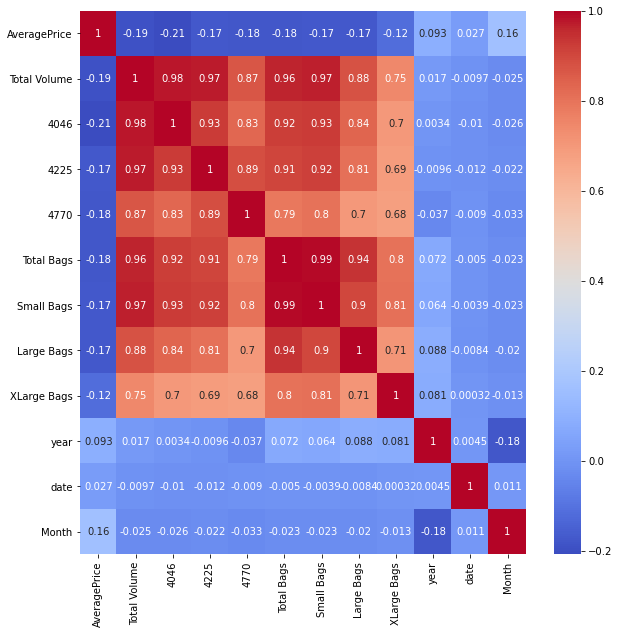

In [24]:
#Checking correlation using Heat Map to get high and low correlated parameteres
plt.figure(figsize=(10,10))
sns.heatmap(data.corr(),cmap='coolwarm',annot=True)
plt.show()

#we see that None of the variable has strong correlation with Average Price,instead most of them are correlated with each other. 
#Total Volume highly postively correlated with 4046,smallBags and Large Bags.Least correlated with XlargeBags.
4046,4770,4225 have strong postive correlation among each others.

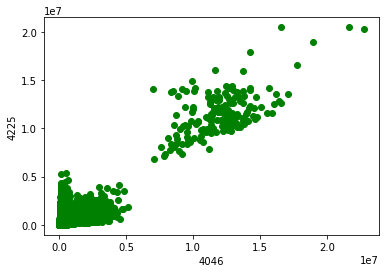

In [71]:
plt.scatter(data['4046'],data['4225'], color = 'green')
plt.xlabel('4046')
plt.ylabel('4225')
plt.show()

In [ ]:
# we see that both have linear realtionship

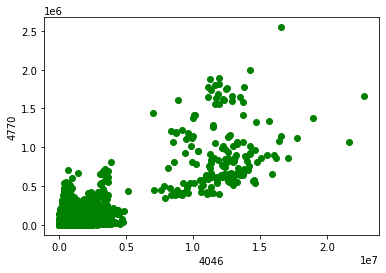

In [30]:
plt.scatter(data['4046'],data['4770'], color = 'green')
plt.xlabel('4046')
plt.ylabel('4770')
plt.show()

In [31]:
# we see that both have linear realtionship

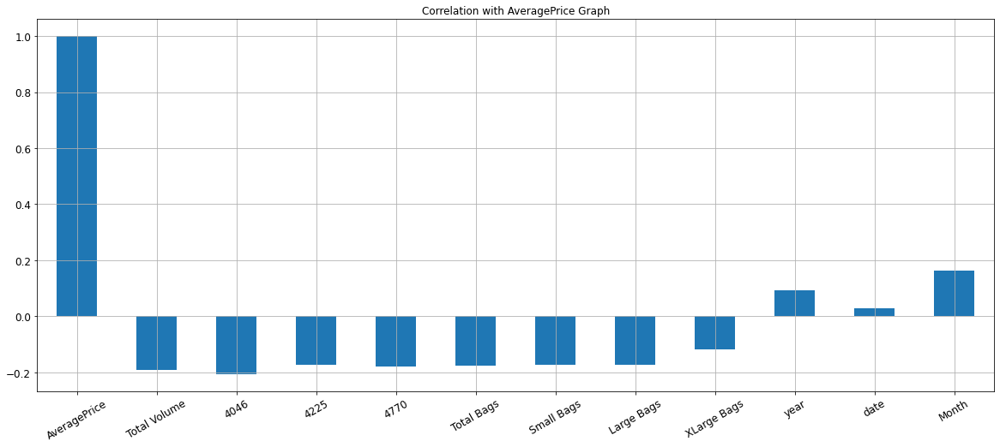

In [27]:
#Correlation with AveragePrice with respect to attributes
data.corrwith(data.AveragePrice).plot.bar(
        figsize = (20, 8), title = "Correlation with AveragePrice Graph", fontsize = 12,rot = 30, grid = True)
plt.show()

#we see that month, year, data feature is the only positively Correlated, rest are negatively correlated with Avearge Price label

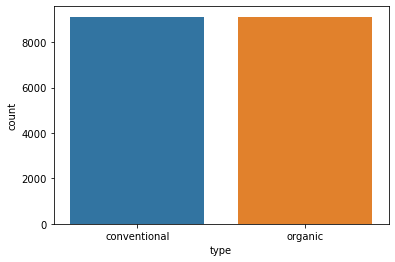

In [28]:
sns.countplot(x='type',data=data)
plt.show()

In [29]:
#Type is equally distributed between conventional and organic

In [70]:
#We can see that production in 2016 & 2017 year is similar, and 2018 as higher Volume

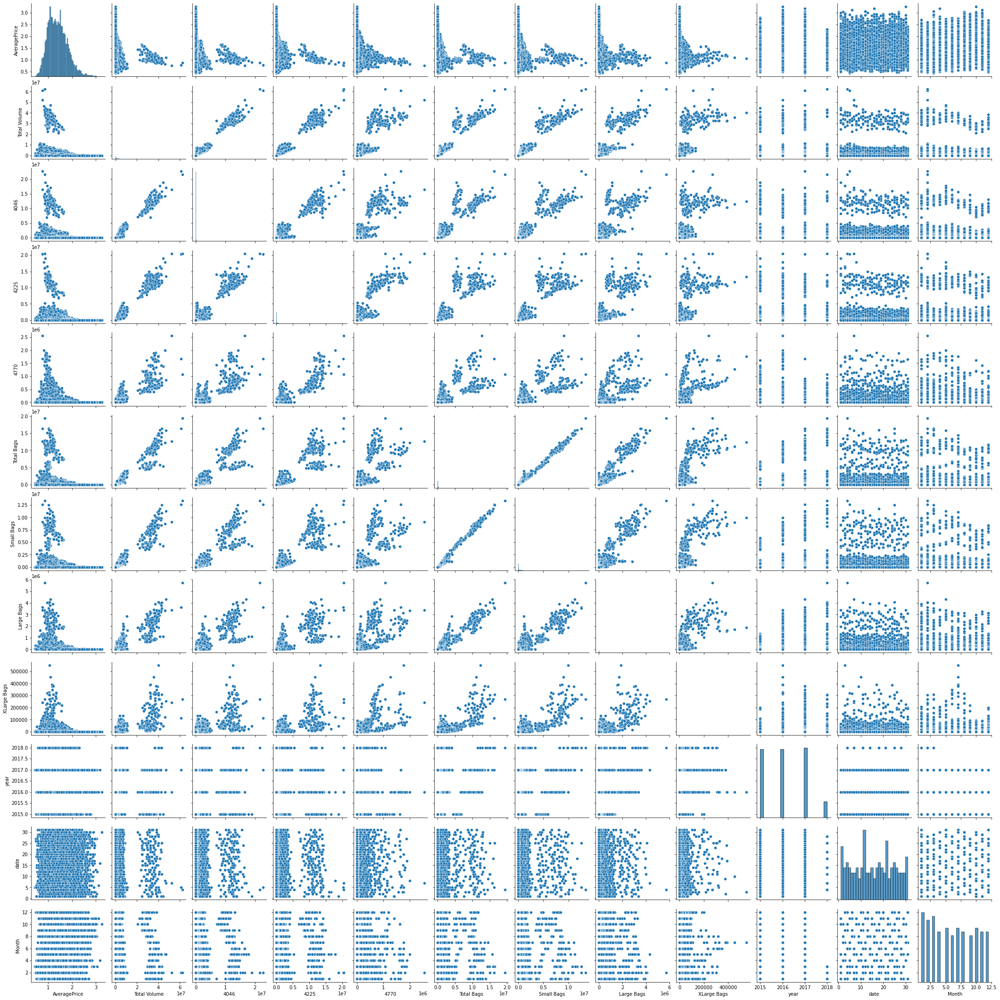

In [31]:
sns.pairplot(data)

In [32]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
data['region']=le.fit_transform(data['region'])

In [33]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
data['type']=le.fit_transform(data['type'])

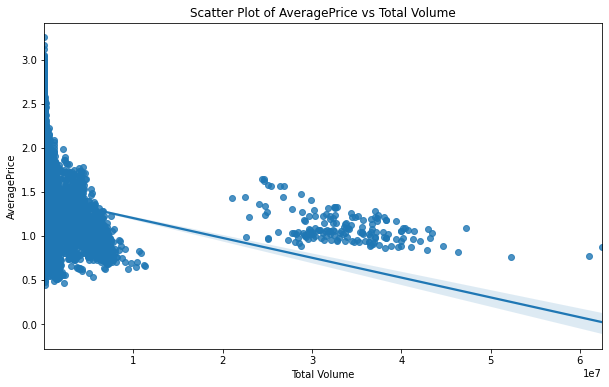

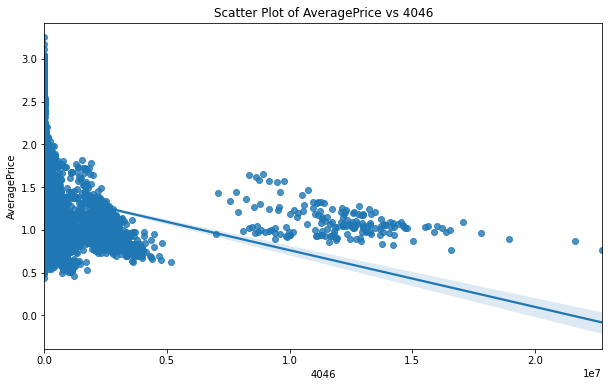

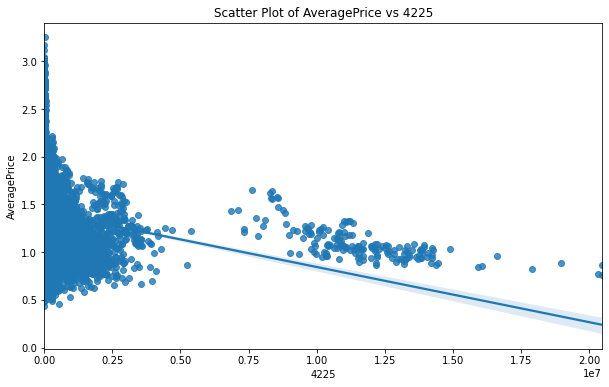

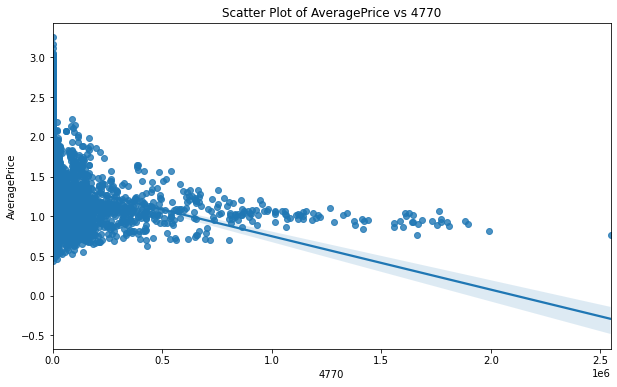

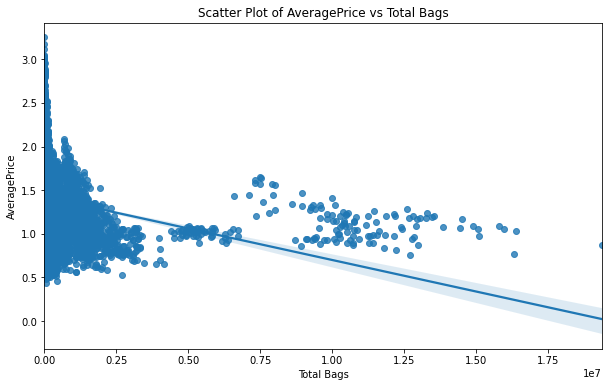

...

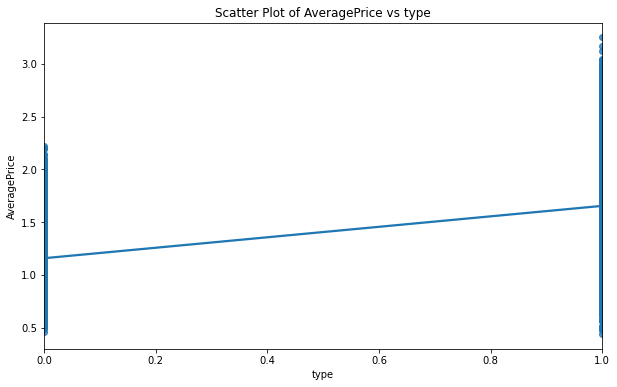

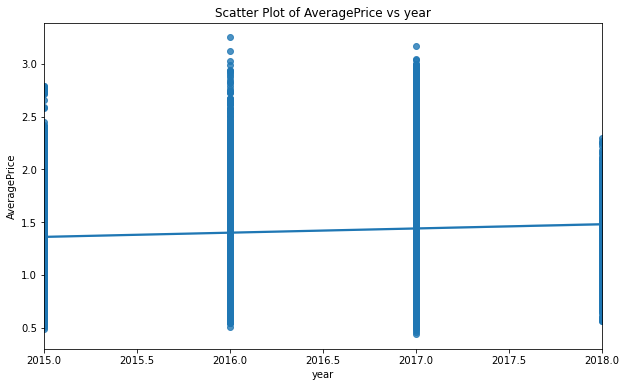

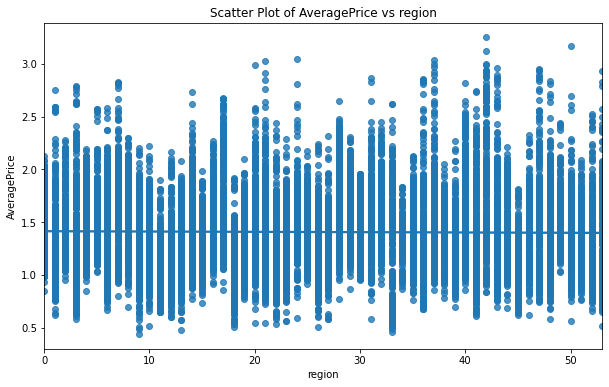

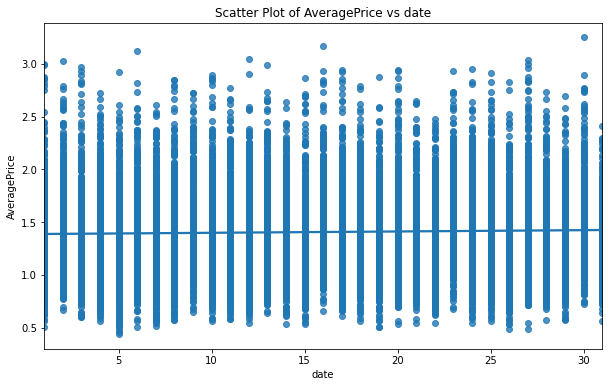

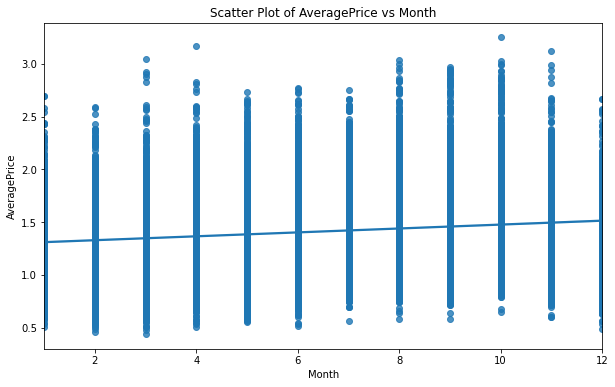

In [34]:
collist=data.columns.values
for i in range(1,len(collist)):
    plt.figure(figsize = (10,6))
    sns.regplot(data[collist[i]], data['AveragePrice'])
    plt.title('Scatter Plot of AveragePrice vs %s' %(collist[i]))
    plt.xlabel(collist[i])
    plt.ylabel('AveragePrice')
    plt.show()

In [35]:
# Only few feature as positive correaltion

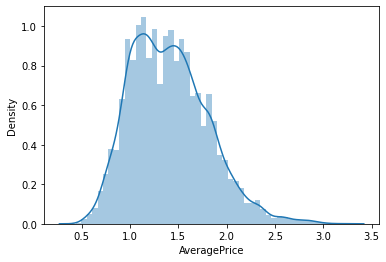

In [36]:
sns.distplot(data['AveragePrice'])
plt.show()


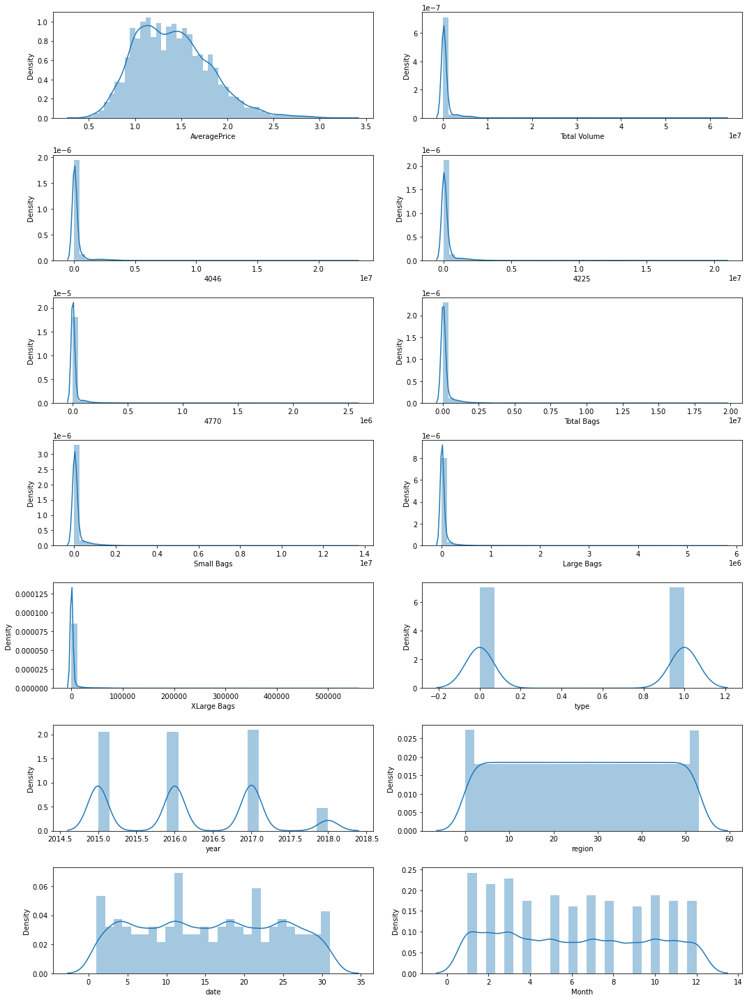

In [37]:
#Lets see how that is disturbuted
plt.figure(figsize=(15,20), facecolor ='white')
plotnumber=1
for columns in data:
    if plotnumber <=14:
        ax=plt.subplot(7,2,plotnumber)
        sns.distplot(data[columns])
        plotnumber+=1
plt.tight_layout()

In [38]:
# we see that skewness and outlier are present in our dataset

In [39]:
data.skew()

AveragePrice     0.580303
Total Volume     9.007687
4046             8.648220
4225             8.942466
4770            10.159396
Total Bags       9.756072
Small Bags       9.540660
Large Bags       9.796455
XLarge Bags     13.139751
type             0.000329
year             0.215339
region           0.000030
date             0.014310
Month            0.106617
dtype: float64

In [40]:
#Removing outliers using zscore
from scipy.stats import zscore
z = np.abs(zscore(data))
print(np.where(z>3))

(array([  346,   359,   780, ..., 17304, 17402, 17428], dtype=int64), array([2, 2, 8, ..., 0, 0, 0], dtype=int64))


In [41]:
threshold=3
new_data=data[(z<3).all(axis=1)]
print(data.shape)
print(new_data.shape)

(18249, 14)
(17651, 14)


In [42]:
# here 467 rows will be droped

In [43]:
#checking for how much data we lost
loss_percent=(30-29)/30*100
print(loss_percent)

3.3333333333333335


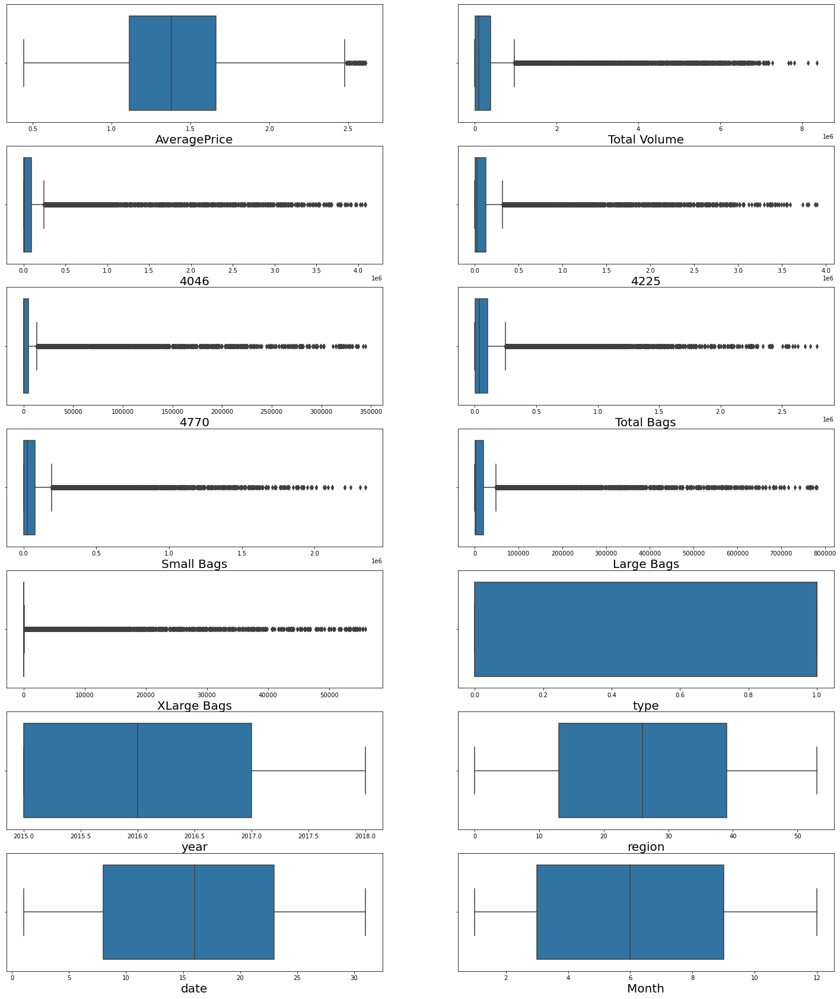

In [44]:
#Checking for outliers using box plot
plt.figure(figsize=(25,30), facecolor='white')
plotnumber = 1

for column in new_data:
    if plotnumber<=14 :     # as there are 14 columns in the data
        ax = plt.subplot(7,2,plotnumber)
        sns.boxplot(new_data[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

In [45]:
# Checking skewness after outlier removal
new_data.skew()

AveragePrice    0.377432
Total Volume    3.767138
4046            4.909848
4225            4.455745
4770            5.117170
Total Bags      4.066771
Small Bags      4.222706
Large Bags      5.053434
XLarge Bags     6.135607
type           -0.037741
year            0.229976
region          0.012798
date            0.011778
Month           0.107408
dtype: float64

In [46]:
#The Skewness has reduce significantly after outlier removal but still there is skewness present in the variables.

In [47]:
from sklearn.preprocessing import power_transform
Avocado = power_transform(new_data)
Avocado=pd.DataFrame(Avocado,columns = new_data.columns)

In [48]:
# Now we split dataset into feature and label
x=Avocado.drop(columns='AveragePrice')
y=Avocado['AveragePrice']

In [49]:
# Now we see that skewess is removed, and data is ready to fit and predict

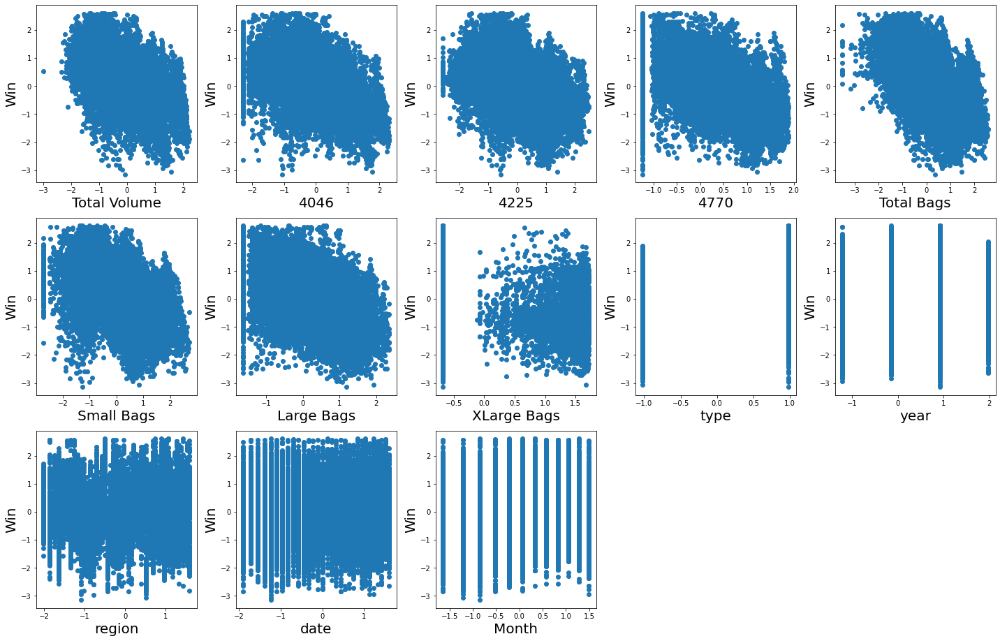

In [51]:
#Let's observe the relationship between independent variables and dependent variable.

plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for column in x:
    if plotnumber<=30 :
        ax = plt.subplot(6,5,plotnumber)
        plt.scatter(x[column],y)
        plt.xlabel(column,fontsize=20)
        plt.ylabel('Win',fontsize=20)
    plotnumber+=1
plt.tight_layout()

In [52]:
scalar = StandardScaler()
X_scaled = scalar.fit_transform(x)

In [53]:
# PCA is required for the analysis to reduce curse of Dimensionality
from sklearn.decomposition import PCA
pca = PCA()
pca.fit_transform(X_scaled)

array([[-0.71438546, -2.10550036,  2.17340044, ..., -0.6832387 ,
        -0.03471231,  0.06893683],
       [-0.76443899, -2.08418291,  2.12752368, ..., -0.72276802,
        -0.03542229,  0.04643702],
       [-0.46224553, -2.15721973,  2.06469943, ..., -0.60590402,
         0.03194394,  0.23075038],
       ...,
       [-1.53866196,  2.41808307, -1.3963756 , ...,  0.85936956,
         0.01144891, -0.04152101],
       [-1.40857147,  2.42686515, -1.47698509, ...,  0.8555435 ,
         0.01471586, -0.04137569],
       [-1.46217046,  2.45023513, -1.57929742, ...,  0.77858995,
         0.03640723, -0.0617845 ]])

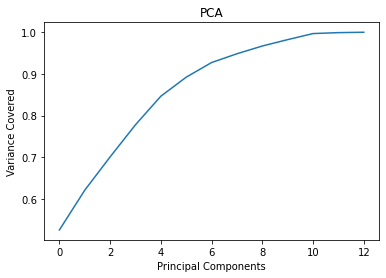

In [54]:
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Principal Components')
plt.ylabel('Variance Covered')
plt.title('PCA')
plt.show()

Around 10 Principal Components are able to explain > 95% variance. Its safe to consider strating 10 PC's

In [55]:
pca = PCA(n_components=12)
new_pcomp=pca.fit_transform(X_scaled)
princi_comp = pd.DataFrame(new_pcomp,columns=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11','PC12'])
princi_comp

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12
0,-0.714385,-2.105500,2.173400,-1.026317,-0.036416,-3.720133e-01,0.521784,-0.691195,0.376906,0.378064,-0.683239,-3.471231e-02
1,-0.764439,-2.084183,2.127524,-0.350588,-0.157028,-3.388608e-01,0.500881,-0.740173,0.296302,0.244210,-0.722768,-3.542229e-02
2,-0.462246,-2.157220,2.064699,0.414244,-0.166248,-3.817074e-01,0.539546,-0.870182,0.162351,0.585924,-0.605904,3.194394e-02
3,-0.692921,-2.136206,1.962367,1.269366,-0.313187,-3.393202e-01,0.370944,-0.827095,0.378308,0.542185,-0.557252,-4.150770e-02
4,-0.810961,-1.983262,2.179752,-1.191814,0.158826,-3.994884e-01,0.274739,-0.819875,0.397804,0.313232,-0.577318,-8.489678e-02
5,-0.809514,-1.979055,2.115741,-0.525634,0.065629,-3.597426e-01,0.373969,-0.706378,0.458293,0.385974,-0.638992,-7.179720e-02
6,-0.539482,-2.008198,2.052795,0.207203,0.005542,-3.801287e-01,0.474917,-0.753302,0.332300,0.444081,-0.570856,-2.704268e-02
7,-0.483656,-1.957615,1.965478,1.022082,-0.161308,-5.782485e-01,0.160443,-0.880923,0.230681,0.580489,-0.691155,-4.214967e-02
8,-0.368360,-1.944297,1.870513,2.074491,-0.319591,-4.901320e-01,0.401112,-0.737372,0.225324,0.394192,-0.707317,-3.544739e-02
9,-0.499988,-1.816873,2.122473,-0.796630,0.249908,-5.873892e-01,0.179593,-0.835598,0.253851,0.309244,-0.644575,-7.589547e-02


In this data set we can see that there is linear/continuos data hence we use regression method to train and predict the variables

In [56]:
# To find the best random state using Linear Regressor model
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

maxAccu=0
maxRS=0

maxR2_Score=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(princi_comp,y,test_size=.30,random_state=i)
    LR = LinearRegression()
    LR.fit(x_train, y_train)
    predrf = LR.predict(x_test)
    score = r2_score(y_test, predrf)
    if score>maxR2_Score:
        maxR2_Score=score
        maxRS=i
print("Best accuracy is",maxR2_Score," on Random_state ",maxRS)

Best accuracy is 0.5870096471345365  on Random_state  28


In [57]:
x_train,x_test,y_train,y_test=train_test_split(princi_comp,y,test_size=.30,random_state=maxRS)

In [58]:
# Finding Best Algorithm
#importing all the required libraries to find best Algorithm
from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.svm import SVR
from sklearn.model_selection import cross_val_score

In [59]:
model=[LinearRegression(),RandomForestRegressor(),DecisionTreeRegressor(),KNeighborsRegressor(),Ridge(),Lasso(),SVR()]

In [60]:
for m in model:
    print("*******************************************************************************")
    
    print('accuracy score of ->', m)
    
    m.fit(x_train,y_train)
    
    pred = m.predict(x_test)
    
    print("R2 Score:                ", r2_score(y_test,pred))
    
    print("Mean Absolute Error:     ", mean_absolute_error(y_test,pred))
    
    print("Mean Squared error:      ", mean_squared_error(y_test,pred))
    
    print("Root Mean Squared Error: ", np.sqrt(mean_squared_error(y_test,pred)))
    
    score=cross_val_score(m,x,y,cv=5)
    
    print(score)
    
    print("cross validation score:  ", abs(score.mean()))
    
    print("Difference between R2 score and cross validatio score is -> ",r2_score(y_test,pred)-abs(score.mean()))
    
    print("--------------------------------**********************--------------------------------------")

*******************************************************************************
accuracy score of -> LinearRegression()
R2 Score:                 0.5870096471345365
Mean Absolute Error:      0.5146544363287423
Mean Squared error:       0.4160359308045502
Root Mean Squared Error:  0.6450084734362411
[-0.05982124  0.23831509  0.46278648  0.23966047  0.3183246 ]
cross validation score:   0.23985308124206176
Difference between R2 score and cross validatio score is ->  0.3471565658924748
--------------------------------**********************--------------------------------------
*******************************************************************************
accuracy score of -> RandomForestRegressor()
R2 Score:                 0.8567055718529042
Mean Absolute Error:      0.2828805507127278
Mean Squared error:       0.1443511461700009
Root Mean Squared Error:  0.3799357132068541
[-0.09447898  0.46201583  0.65585192  0.14272569  0.04001814]
cross validation score:   0.2412265193391497
Differe

In [61]:
#We see that LinearRegressor give  58% accuracy and least difference

In [62]:
# Let's Use GridSearchCV for the best parameter to improve the accuracy

In [63]:
param_grid = {'fit_intercept' : [True, False],'normalize' : [True, False],'copy_X':[True, False],
             'positive':[True, False]}

In [64]:
grid_search = GridSearchCV(LinearRegression(), param_grid = param_grid, cv = 5,n_jobs = -1 )

In [65]:
grid_search.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=LinearRegression(), n_jobs=-1,
             param_grid={'copy_X': [True, False],
                         'fit_intercept': [True, False],
                         'normalize': [True, False],
                         'positive': [True, False]})

In [66]:
best_parameters = grid_search.best_params_

In [67]:
regression = LinearRegression(copy_X = True, fit_intercept = False, normalize = True, positive = False)
regression.fit(x_train, y_train)
reg_score = regression.score(x_train, y_train)

In [68]:
y_pred = regression.predict(x_test)

regression_score = r2_score(y_test,y_pred)
print('R2 Score ----->',regression_score)

regression_rmse=np.sqrt(mean_squared_error(y_test, y_pred))
print('Root Mean square Error ----->',regression_rmse)

knn_mse = mean_squared_error(y_test, y_pred)
print('mean_squared_error ----->',regression_rmse)

test_score = regression.score(x_test, y_test)
print('Test Score ----->',test_score)

R2 Score -----> 0.5870204391154912
Root Mean square Error -----> 0.6450000459214242
mean_squared_error -----> 0.6450000459214242
Test Score -----> 0.5870204391154912


conclusion Hyperparameter Tuning LinearRegression score 58%.

In [69]:
#Saving The Model
import joblib
joblib.dump(regression,"Avocado.csv'.pkl")

["Avocado.csv'.pkl"]